In [54]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.datasets import cifar10
import numpy as np
from matplotlib import pyplot as plt

In [55]:
tf.random.set_seed(1) # tensorflow

In [56]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data() # Carregamento da base de dados
dataset = np.concatenate([x_train, x_test], axis=0) # junta os dados do treino e do teste
dataset = dataset.astype("float32") / 255 # normalizacao

In [57]:
BATCH_SIZE = 64
# camadas convolucionais trabalham com três canais
# criando um objeto
dataset = tf.data.Dataset.from_tensor_slices(dataset)
# setando o batch size pra que nao leia uma imagem por vez
dataset = dataset.shuffle(buffer_size=1024).batch(BATCH_SIZE)

In [58]:
# Criação do modelo
generator = keras.models.Sequential([
  keras.layers.InputLayer(input_shape=(150,)),
  layers.Dense(8*8*256),
  layers.Reshape(target_shape=(8, 8, 256)),
  layers.Conv2DTranspose(256, 3, activation=keras.layers.LeakyReLU(), strides=2, padding="same"),
  layers.Conv2DTranspose(128, 3, activation=keras.layers.LeakyReLU(), strides=2, padding="same"),
  layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")
])

generator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                     │ (None, 16384)               │       2,473,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_4 (Reshape)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_12                  │ (None, 16, 16, 256)         │         590,080 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_13                  │ (None, 32, 32, 128)         │         295,040 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_14                  │ (None, 32, 32, 3)           │           3,459 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,362,563 (12.83 MB)

 Trainable params: 3,362,563 (12.83 MB)

 Non-trainable params: 0 (0.00 B)

In [59]:
# geração do discrimador
discriminator = keras.models.Sequential([
  keras.layers.InputLayer(input_shape=(32, 32, 3)),
  layers.Conv2D(256, 3, activation="relu", strides=2, padding="same"),
  layers.Conv2D(128, 3, activation="relu", strides=2, padding="same"),
  layers.Flatten(),
  layers.Dense(64, activation="relu"),
  layers.Dropout(0.2),
  layers.Dense(1, activation="sigmoid")
])

discriminator.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 16, 16, 256)         │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 8, 8, 128)           │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 64)                  │         524,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 826,625 (3.15 MB)

 Trainable params: 826,625 (3.15 MB)

 Non-trainable params: 0 (0.00 B)

In [60]:
# Definição da taxa de apredizado, tem que manter taxas diferentes para haver uma competição balanceada
optimizerG = keras.optimizers.Adam(learning_rate=0.00001, beta_1=0.5)
optimizerD = keras.optimizers.Adam(learning_rate=0.00003, beta_1=0.5)

# classificador binário
lossFn = keras.losses.BinaryCrossentropy(from_logits=True)

# métrica pra acurácia
gAccMetric = tf.keras.metrics.BinaryAccuracy()
dAccMetric = tf.keras.metrics.BinaryAccuracy()

In [61]:
@tf.function
def trainDStep(data):
  batchSize = tf.shape(data)[0]
  noise = tf.random.normal(shape=(batchSize, 150))
  # concatenação dos titulos fakes e dos reais
  y_true = tf.concat([tf.ones(batchSize, 1),tf.zeros(batchSize, 1)],axis=0)
  # gravação dos gradientes
  with tf.GradientTape() as tape:
    fake = generator(noise)
    # concatena os dados fakes e reais
    x = tf.concat([data, fake], axis=0)
    # confere se o discriminador é capaz
    y_pred = discriminator(x)
    # calculo da loss
    discriminatorLoss = lossFn(y_true, y_pred)
  # atualiza os pesos
  grads = tape.gradient(discriminatorLoss, discriminator.trainable_weights)
  optimizerD.apply_gradients(zip(grads, discriminator.trainable_weights))
  # reporta acurácia
  dAccMetric.update_state(y_true, y_pred)
  # retorna a loss para visualizaçõa
  return {"discriminator_loss": discriminatorLoss,"discriminator_accuracy": dAccMetric.result()}

In [62]:
@tf.function
def trainGStep(data):
  batchSize = tf.shape(data)[0]
  noise = tf.random.normal(shape=(batchSize, 150))
  # saída é classificada como verdadeira
  y_true = tf.ones(batchSize, 1)

  with tf.GradientTape() as tape:
    y_pred = discriminator(generator(noise)) # confere se o discriminador é capaz
    generatorLoss = lossFn(y_true, y_pred) # calculo da loss
  # atualiza os pesos
  grads = tape.gradient(generatorLoss, generator.trainable_weights)
  optimizerG.apply_gradients(zip(grads, generator.trainable_weights))
  # reporta acurácia
  gAccMetric.update_state(y_true, y_pred)
  # retorna a loss para visualizaçõa
  return {"generator_loss": generatorLoss,"generator_accuracy": gAccMetric.result()}

In [63]:
# mostrando as imagens
def plotImages(model):
    images = model(np.random.normal(size=(81, 150)))
    plt.figure(figsize=(9, 9))
    for i, image in enumerate(images):
        plt.subplot(9,9,i+1)
        image_np = image.numpy()
        plt.imshow(np.squeeze(image_np), cmap="Greys_r")
        plt.axis('off')

    plt.show();

/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:780: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


E:0, Loss G:2.1914, Loss D:0.1999, Acc G:%0.34, Acc D:%90.72


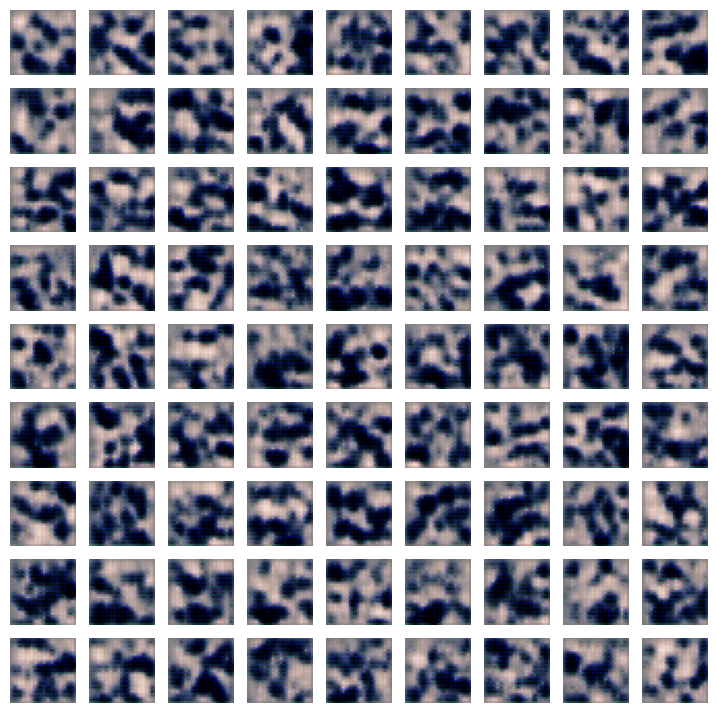

E:1, Loss G:2.3635, Loss D:0.2014, Acc G:%1.16, Acc D:%94.42
E:2, Loss G:1.6956, Loss D:0.3456, Acc G:%2.55, Acc D:%92.82


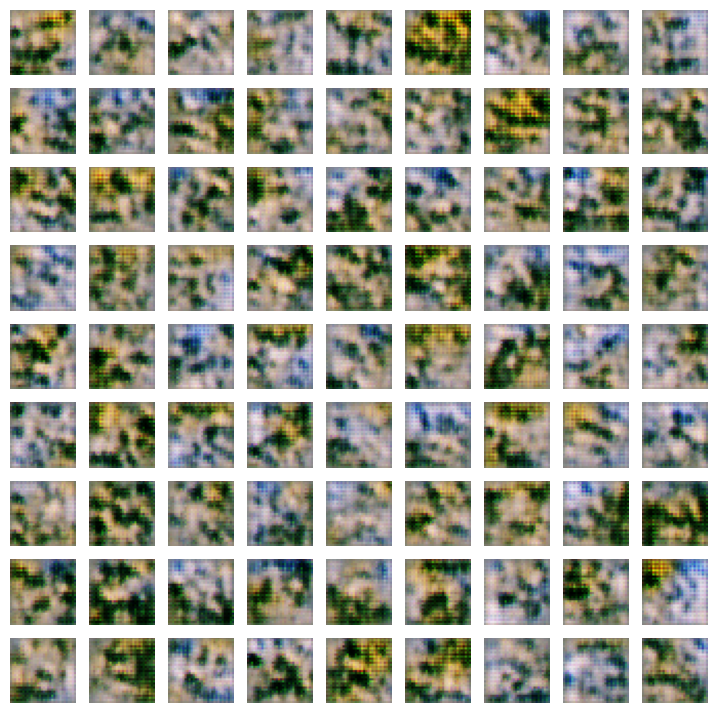

E:3, Loss G:1.4431, Loss D:0.4099, Acc G:%4.60, Acc D:%90.67
E:4, Loss G:1.3492, Loss D:0.4315, Acc G:%6.19, Acc D:%88.84


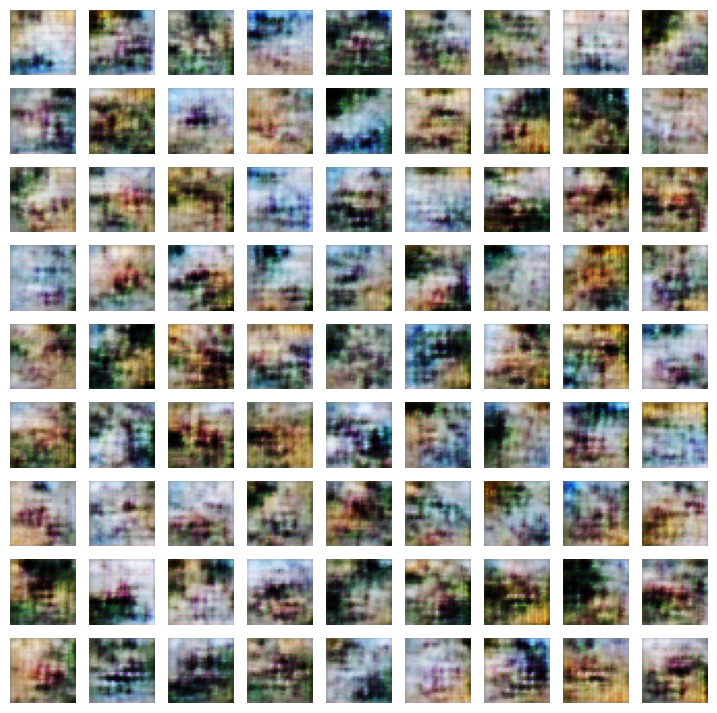

E:5, Loss G:1.2236, Loss D:0.4681, Acc G:%7.61, Acc D:%87.19
E:6, Loss G:1.1222, Loss D:0.5182, Acc G:%8.94, Acc D:%85.66


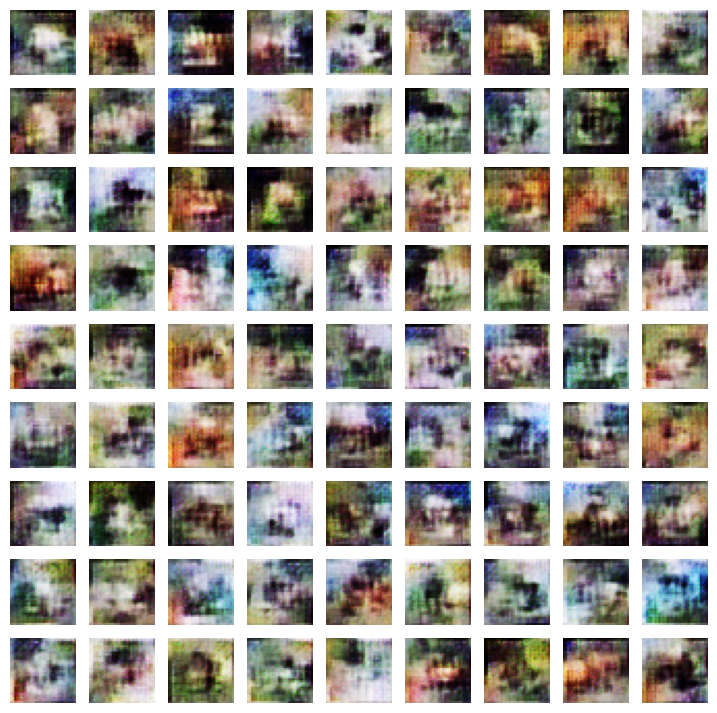

E:7, Loss G:1.2203, Loss D:0.4664, Acc G:%10.06, Acc D:%84.40
E:8, Loss G:1.2432, Loss D:0.4850, Acc G:%10.58, Acc D:%83.80


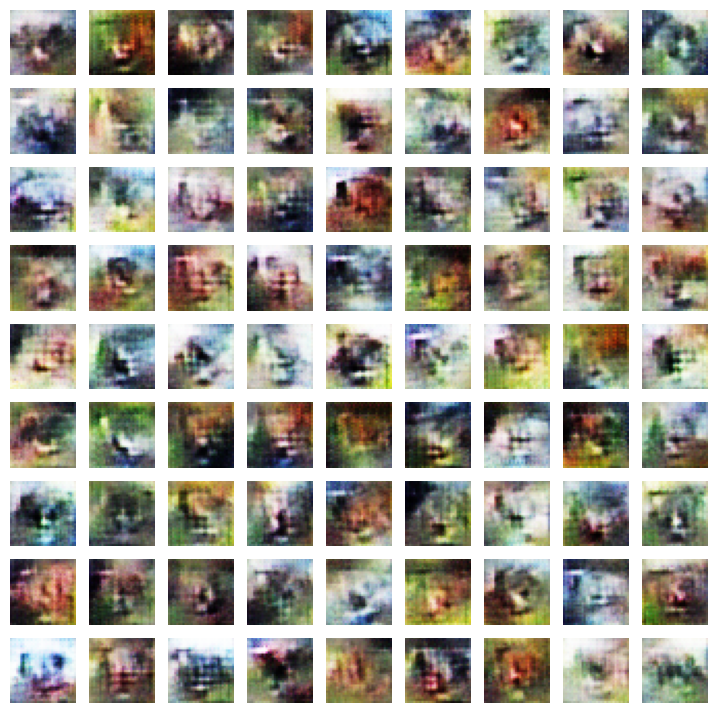

E:9, Loss G:1.1555, Loss D:0.5243, Acc G:%11.40, Acc D:%82.90
E:10, Loss G:1.1157, Loss D:0.5356, Acc G:%12.26, Acc D:%81.98


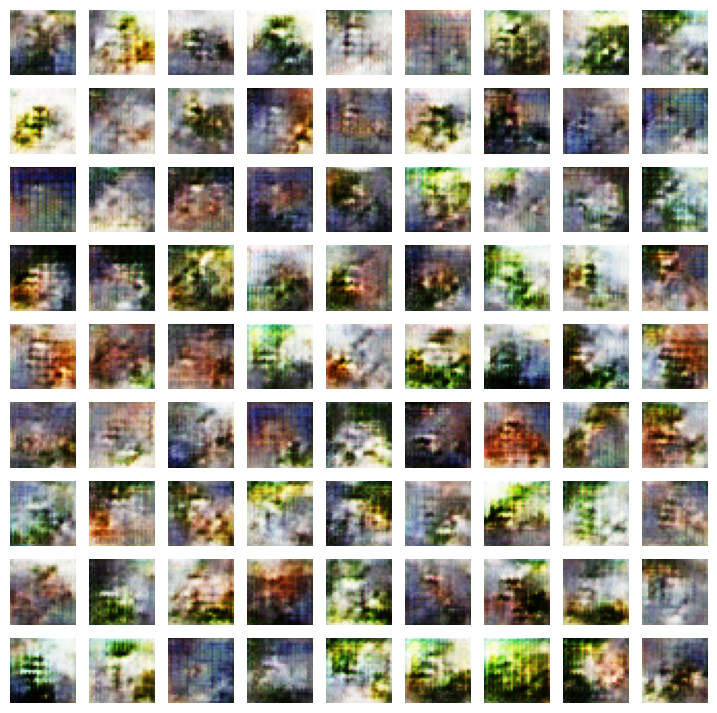

E:11, Loss G:1.0641, Loss D:0.6033, Acc G:%13.37, Acc D:%80.94
E:12, Loss G:0.9883, Loss D:0.6192, Acc G:%14.71, Acc D:%79.65


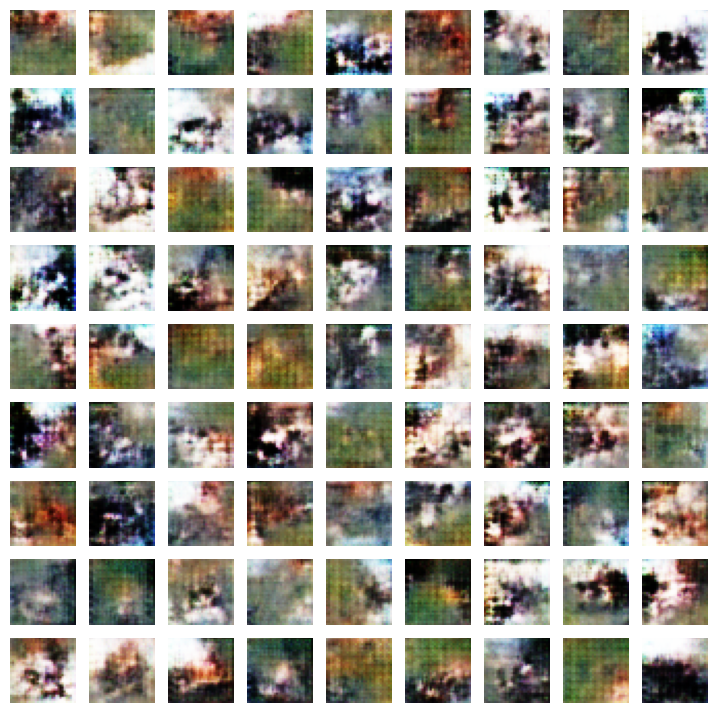

E:13, Loss G:0.9210, Loss D:0.6355, Acc G:%15.87, Acc D:%78.48
E:14, Loss G:0.9084, Loss D:0.6437, Acc G:%16.94, Acc D:%77.33


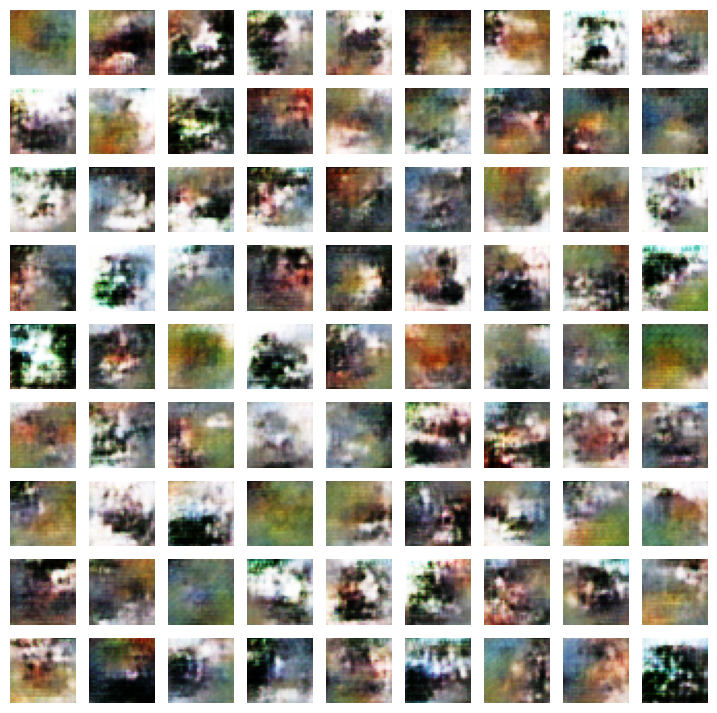

E:15, Loss G:0.8839, Loss D:0.6562, Acc G:%17.93, Acc D:%76.25
E:16, Loss G:0.8871, Loss D:0.6345, Acc G:%18.72, Acc D:%75.37


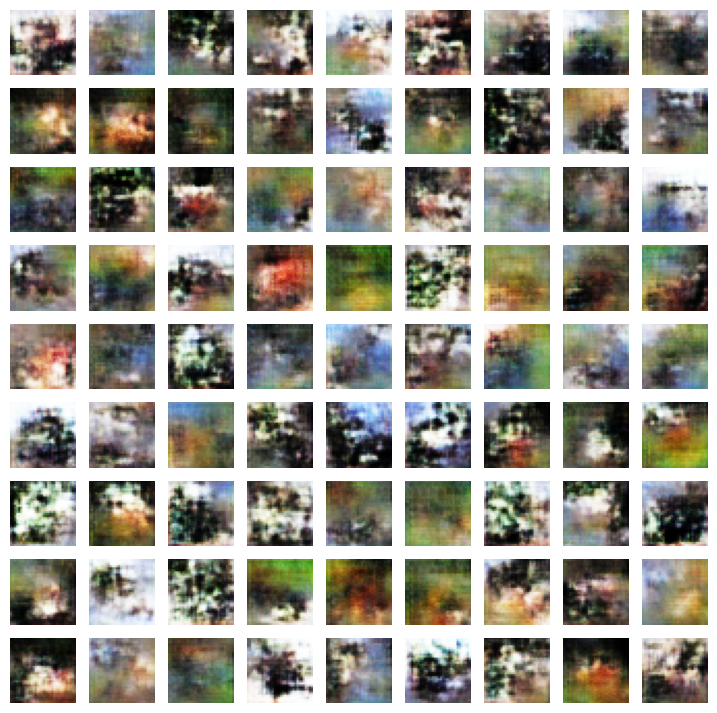

E:17, Loss G:0.8820, Loss D:0.6411, Acc G:%19.38, Acc D:%74.61
E:18, Loss G:0.8728, Loss D:0.6358, Acc G:%19.98, Acc D:%73.92


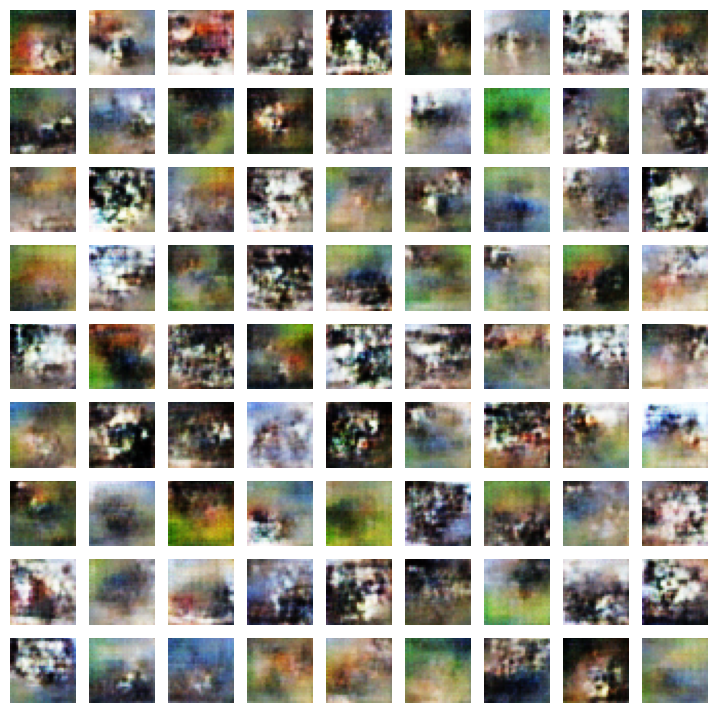

E:19, Loss G:0.8960, Loss D:0.6246, Acc G:%20.45, Acc D:%73.35
E:20, Loss G:0.9379, Loss D:0.6076, Acc G:%20.79, Acc D:%72.93


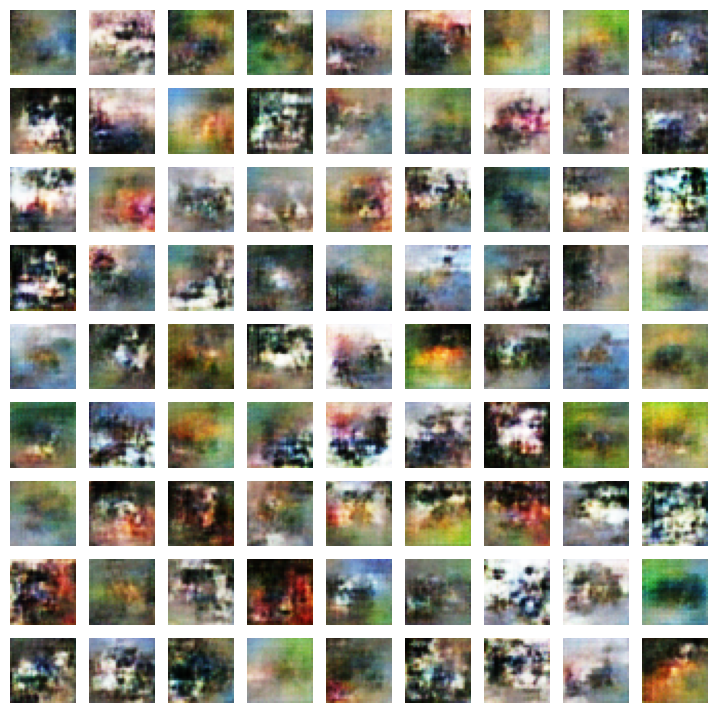

E:21, Loss G:0.9580, Loss D:0.5866, Acc G:%21.04, Acc D:%72.65
E:22, Loss G:1.0036, Loss D:0.5716, Acc G:%21.16, Acc D:%72.48


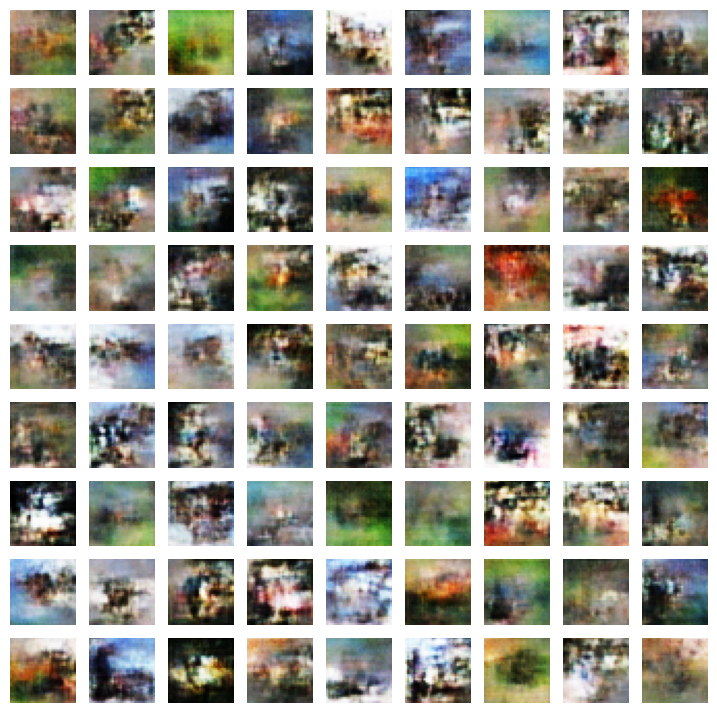

E:23, Loss G:1.0370, Loss D:0.5593, Acc G:%21.21, Acc D:%72.38
E:24, Loss G:1.0522, Loss D:0.5427, Acc G:%21.20, Acc D:%72.36


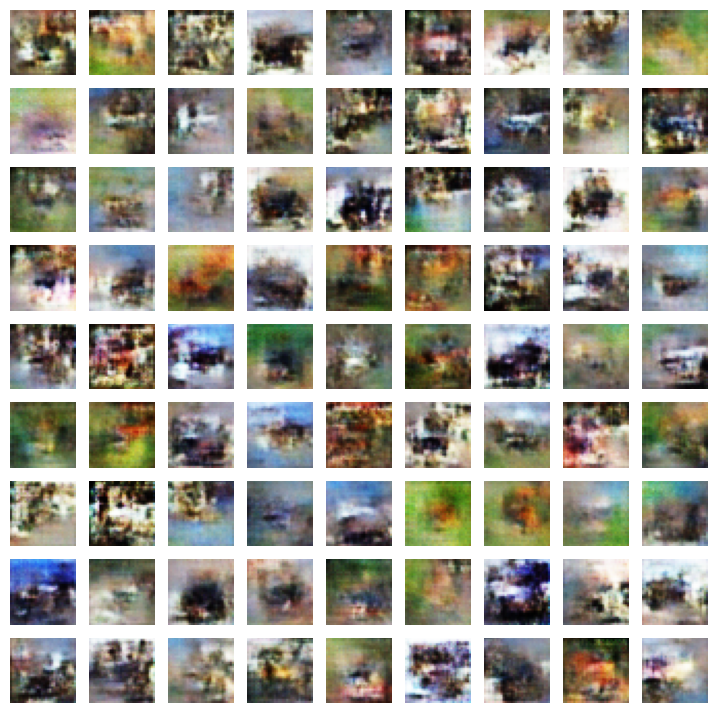

E:25, Loss G:1.0910, Loss D:0.5358, Acc G:%21.16, Acc D:%72.36
E:26, Loss G:1.0910, Loss D:0.5366, Acc G:%21.13, Acc D:%72.37


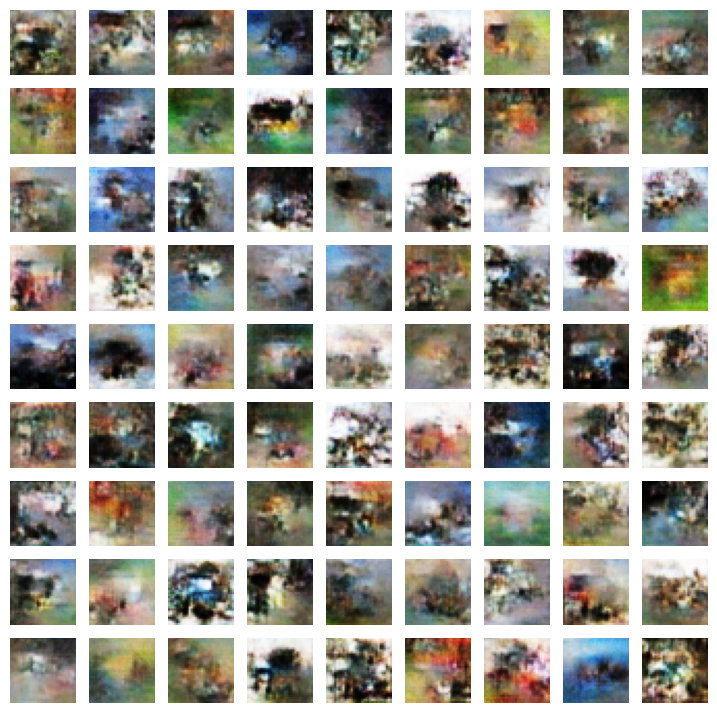

E:27, Loss G:1.0936, Loss D:0.5451, Acc G:%21.11, Acc D:%72.36
E:28, Loss G:1.0925, Loss D:0.5439, Acc G:%21.08, Acc D:%72.35


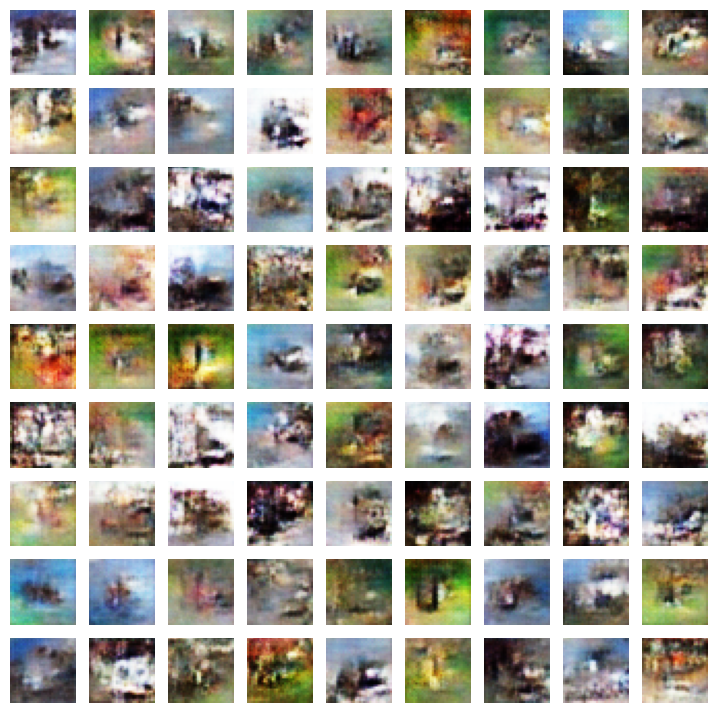

E:29, Loss G:1.1450, Loss D:0.5180, Acc G:%21.03, Acc D:%72.39


In [64]:
# Treinamento com 30 epocas
for epoch in range(30):

  # variaveis para amazenamento dos dados do treinamento
  dLossSum = 0
  gLossSum = 0
  dAccSum = 0
  gAccSum = 0
  cnt = 0
  for batch in dataset:
    # treina o discriminador
    dLoss = trainDStep(batch)
    dLossSum += dLoss['discriminator_loss']
    dAccSum += dLoss['discriminator_accuracy']
    # treina o gerador
    gLoss = trainGStep(batch)
    gLossSum += gLoss['generator_loss']
    gAccSum += gLoss['generator_accuracy']
    cnt += 1

  # printa o resultado
  print("E:{}, Loss G:{:0.4f}, Loss D:{:0.4f}, Acc G:%{:0.2f}, Acc D:%{:0.2f}".format(
      epoch,
      gLossSum/cnt,
      dLossSum/cnt,
      100 * gAccSum/cnt,
      100 * dAccSum/cnt
  ))

  if epoch % 2 == 0:
    plotImages(generator)

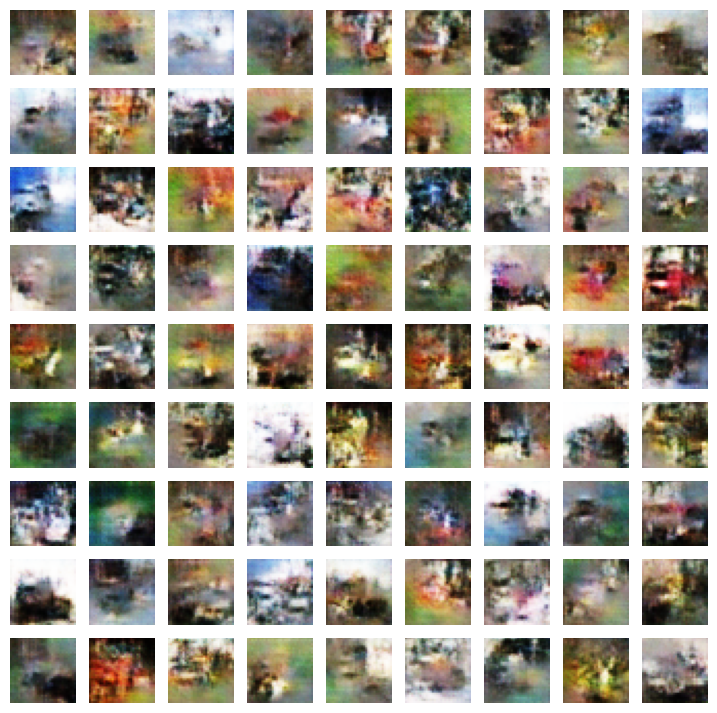

In [66]:
# Geração de imagens com o modelo treinado
images = generator(np.random.normal(size=(81, 150)))
# mostra as imagens geradas
plt.figure(figsize=(9, 9))
for i, image in enumerate(images):
    plt.subplot(9,9,i+1)
    plt.imshow(np.squeeze(image), cmap="Greys_r")
    plt.axis('off')
plt.show();